In [1]:
import xarray as xr
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from matplotlib.colors import ListedColormap

data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data)

In [60]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Define the path to your NetCDF file
data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data, 'r')

# Extract coordinates and Times
xlat = dataset.variables['XLAT'][0, :, :]  # [south_north, west_east]
xlong = dataset.variables['XLONG'][0, :, :]  # [south_north, west_east]
times = dataset.variables['Times'][:]  # [Time, DateStrLen]
times_str = [''.join(char.decode('utf-8') if isinstance(char, bytes) else str(char)
                     for char in time if not np.ma.is_masked(char)).strip().rstrip('\x00')
             for time in times]

# Convert the last timestamp to the desired format
last_time = times_str[-1]  # e.g., '2022-09-29_00:00:00'
# Parse the string to a datetime object
dt = datetime.strptime(last_time, '%Y-%m-%d_%H:%M:%S')
# Function to add ordinal suffix (st, nd, rd, th)
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = 'th'
    else:
        suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(n % 10, 'th')
    return str(n) + suffix
# Format the date as 'September 29th, 2022 (00:00 UTC)'
formatted_time = f"{dt.strftime('%B')} {ordinal(dt.day)}, {dt.year} at {dt.strftime('%H:%M')} UTC"

# Extract LH at the last timestep
lh = dataset.variables['LH'][-1, :, :]  # [south_north, west_east]

# Check the range of LH
print("LH min:", np.min(lh), "max:", np.max(lh))

# Create the plot
fig, ax = plt.subplots(figsize=(30, 24), subplot_kw={'projection': ccrs.LambertConformal()}, dpi=600)
ax.set_extent([xlong.min(), xlong.max(), xlat.min(), xlat.max()], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='black')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot LH as contours with standard colormap
contour = ax.contourf(xlong, xlat, lh, transform=ccrs.PlateCarree(),
                      cmap='twilight', levels=np.linspace(0, 1800, 21))

cbar = plt.colorbar(contour, label='Surface Latent Heat Flux (W/m²)')
cbar.ax.tick_params(labelsize=14)
cbar.set_label('Surface Latent Heat Flux (W/m²)', fontsize=20)

# Update the title with formatted time
plt.title(f'IAN - Surface Latent Heat Flux ({formatted_time})', fontsize=24)
plt.show()

dataset.close()

LH min: -1.804837 max: 1601.0544


HFX min: -320.97678 max: 401.26117


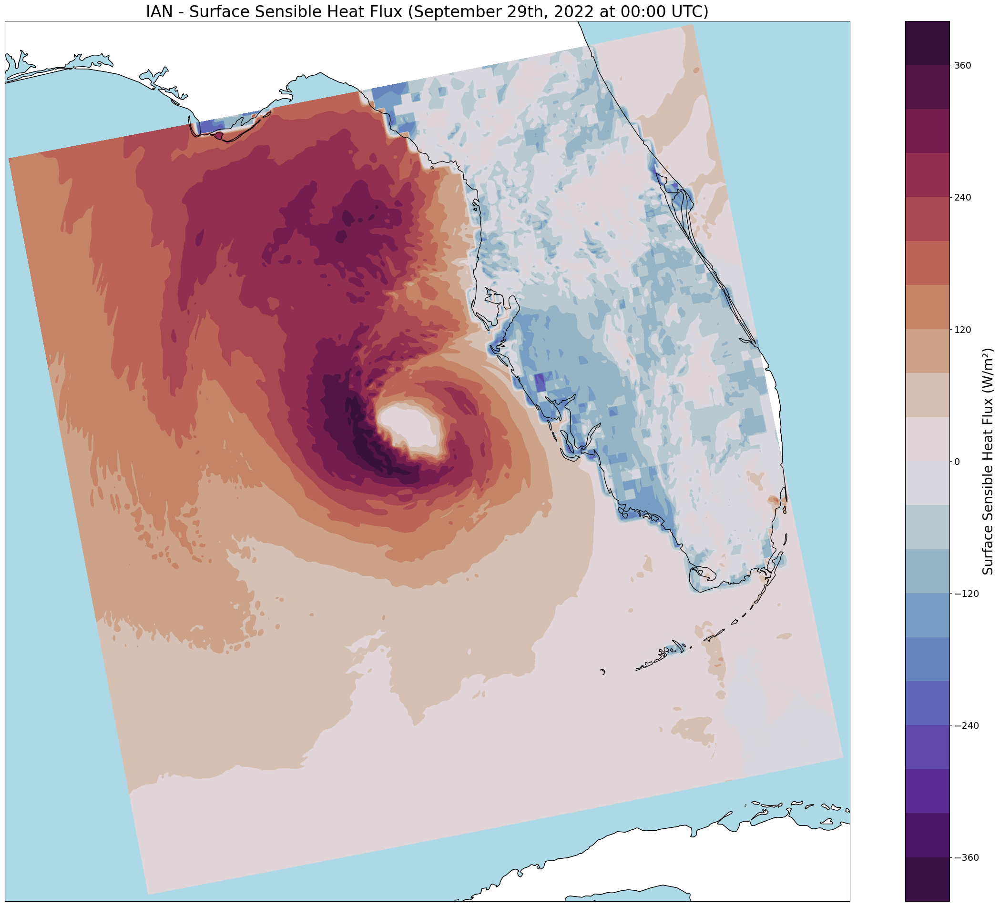

In [61]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Define the path to your NetCDF file
data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data, 'r')

# Extract coordinates and Times
xlat = dataset.variables['XLAT'][0, :, :]  # [south_north, west_east]
xlong = dataset.variables['XLONG'][0, :, :]  # [south_north, west_east]
times = dataset.variables['Times'][:]  # [Time, DateStrLen]
times_str = [''.join(char.decode('utf-8') if isinstance(char, bytes) else str(char)
                     for char in time if not np.ma.is_masked(char)).strip().rstrip('\x00')
             for time in times]

# Convert the last timestamp to the desired format
last_time = times_str[-1]  # e.g., '2022-09-29_00:00:00'
# Parse the string to a datetime object
dt = datetime.strptime(last_time, '%Y-%m-%d_%H:%M:%S')
# Function to add ordinal suffix (st, nd, rd, th)
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = 'th'
    else:
        suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(n % 10, 'th')
    return str(n) + suffix
# Format the date as 'September 29th, 2022 (00:00 UTC)'
formatted_time = f"{dt.strftime('%B')} {ordinal(dt.day)}, {dt.year} at {dt.strftime('%H:%M')} UTC"

# Extract HFX at the last timestep
hfx = dataset.variables['HFX'][-1, :, :]  # [south_north, west_east]

# Check the range of HFX
print("HFX min:", np.min(hfx), "max:", np.max(hfx))

# Create the plot
fig, ax = plt.subplots(figsize=(30, 24), subplot_kw={'projection': ccrs.LambertConformal()})
ax.set_extent([xlong.min(), xlong.max(), xlat.min(), xlat.max()], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='black')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot HFX as contours with standard colormap
contour = ax.contourf(xlong, xlat, hfx, transform=ccrs.PlateCarree(),
                      cmap='twilight_shifted', levels=np.linspace(-400, 400, 21))

cbar = plt.colorbar(contour, label='Surface Sensible Heat Flux (W/m²)')
cbar.ax.tick_params(labelsize=14)
cbar.set_label('Surface Sensible Heat Flux (W/m²)', fontsize=20)

# Update the title with formatted time
plt.title(f'IAN - Surface Sensible Heat Flux ({formatted_time})', fontsize=24)
plt.show()

dataset.close()

In [62]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Define the path to your NetCDF file
data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data, 'r')

# Extract coordinates and Times
xlat = dataset.variables['XLAT'][0, :, :]  # [south_north, west_east]
xlong = dataset.variables['XLONG'][0, :, :]  # [south_north, west_east]
times = dataset.variables['Times'][:]  # [Time, DateStrLen]
times_str = [''.join(char.decode('utf-8') if isinstance(char, bytes) else str(char)
                     for char in time if not np.ma.is_masked(char)).strip().rstrip('\x00')
             for time in times]

# Convert the last timestamp to the desired format
last_time = times_str[-1]  # e.g., '2022-09-29_00:00:00'
# Parse the string to a datetime object
dt = datetime.strptime(last_time, '%Y-%m-%d_%H:%M:%S')
# Function to add ordinal suffix (st, nd, rd, th)
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = 'th'
    else:
        suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(n % 10, 'th')
    return str(n) + suffix
# Format the date as 'September 29th, 2022 (00:00 UTC)'
formatted_time = f"{dt.strftime('%B')} {ordinal(dt.day)}, {dt.year} at {dt.strftime('%H:%M')} UTC"

# Extract U10 and V10 at the last timestep
u10 = dataset.variables['U10'][-1, :, :]
v10 = dataset.variables['V10'][-1, :, :]

# Calculate wind speed
wind_speed = np.sqrt(u10**2 + v10**2)

# Create the plot
fig, ax = plt.subplots(figsize=(30, 24), subplot_kw={'projection': ccrs.LambertConformal()}, dpi=600)
ax.set_extent([xlong.min(), xlong.max(), xlat.min(), xlat.max()], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='black')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot wind speed as contours
contour = ax.contourf(xlong, xlat, wind_speed, transform=ccrs.PlateCarree(),
                      cmap='berlin', levels=np.linspace(0, 60, 21))
cbar = plt.colorbar(contour, label='10-m Wind Speed (m/s)')
cbar.ax.tick_params(labelsize=14)
cbar.set_label('10-m Wind Speed (m/s)', fontsize=20)

# Update the title with formatted time
plt.title(f'IAN - 10-m Wind Speed ({formatted_time})', fontsize=24)
plt.show()

dataset.close()

c:\Users\ustro\anaconda3\envs\coaps-ship\Lib\site-packages\matplotlib\quiver.py:678: RuntimeWarning: Mean of empty slice.
  amean = a.mean()
c:\Users\ustro\anaconda3\envs\coaps-ship\Lib\site-packages\numpy\_core\_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


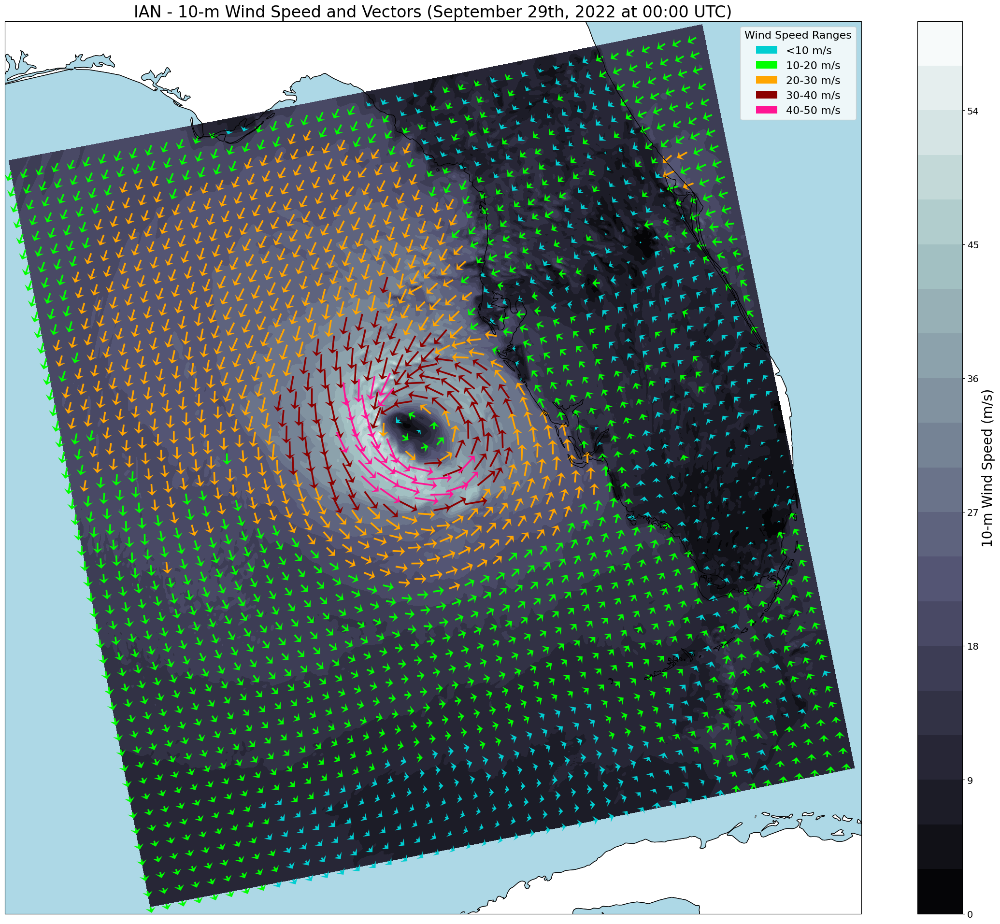

In [58]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Define the path to your NetCDF file
data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data, 'r')

# Extract coordinates and Times
xlat = dataset.variables['XLAT'][0, :, :]  # [south_north, west_east]
xlong = dataset.variables['XLONG'][0, :, :]  # [south_north, west_east]
times = dataset.variables['Times'][:]  # [Time, DateStrLen]
times_str = [''.join(char.decode('utf-8') if isinstance(char, bytes) else str(char)
                     for char in time if not np.ma.is_masked(char)).strip().rstrip('\x00')
             for time in times]

# Convert the last timestamp to the desired format
last_time = times_str[-1]  # e.g., '2022-09-29_00:00:00'
# Parse the string to a datetime object
dt = datetime.strptime(last_time, '%Y-%m-%d_%H:%M:%S')
# Function to add ordinal suffix (st, nd, rd, th)
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = 'th'
    else:
        suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(n % 10, 'th')
    return str(n) + suffix
# Format the date as 'September 29th, 2022 (00:00 UTC)'
formatted_time = f"{dt.strftime('%B')} {ordinal(dt.day)}, {dt.year} at {dt.strftime('%H:%M')} UTC"

# Extract U10 and V10 at the last timestep
u10 = dataset.variables['U10'][-1, :, :]
v10 = dataset.variables['V10'][-1, :, :]

# Calculate wind speed
wind_speed = np.sqrt(u10**2 + v10**2)

# Define wind speed ranges and corresponding colors
speed_ranges = [
    (0, 10, '#00CED1', '<10 m/s'),    # Teal
    (10, 20, '#00FF00', '10-20 m/s'), # Brighter Green (Lime)
    (20, 30, '#FFA500', '20-30 m/s'), # Orange
    (30, 40, '#8B0000', '30-40 m/s'), # Red
    (40, 50, '#FF1493', '40-50 m/s'), # Hot Pink
    (50, np.inf, '#C71585', '50+ m/s') # Bright Purple
]

# Create the plot
fig, ax = plt.subplots(figsize=(30, 24), subplot_kw={'projection': ccrs.LambertConformal()})
ax.set_extent([xlong.min(), xlong.max(), xlat.min(), xlat.max()], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='black')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot wind speed as contours
contour = ax.contourf(xlong, xlat, wind_speed, transform=ccrs.PlateCarree(),
                      cmap='bone', levels=np.linspace(0, 60, 21))

cbar = plt.colorbar(contour, label='10-m Wind Speed (m/s)')
cbar.ax.tick_params(labelsize=14)
cbar.set_label('10-m Wind Speed (m/s)', fontsize=20)

# Plot wind vectors for each speed range with corresponding colors
for min_speed, max_speed, color, label in speed_ranges:
    # Create a mask for the current speed range
    mask = (wind_speed >= min_speed) & (wind_speed < max_speed)
    # Subsample masked data
    xlong_sub = xlong[::15, ::15][mask[::15, ::15]]
    xlat_sub = xlat[::15, ::15][mask[::15, ::15]]
    u10_sub = u10[::15, ::15][mask[::15, ::15]]
    v10_sub = v10[::15, ::15][mask[::15, ::15]]
    # Plot vectors for this range
    if len(xlong_sub) > 0:  # Only plot if there are valid points
        ax.quiver(xlong_sub, xlat_sub, u10_sub, v10_sub,
                  transform=ccrs.PlateCarree(), scale=1500, width=0.002,
                  headwidth=6, headlength=3, headaxislength=2, color=color,
                  label=label)

# Add a legend for the wind vector colors
plt.legend(loc='upper right', title='Wind Speed Ranges', fontsize=16, title_fontsize=16)

# Add a quiver key for reference arrow length
ax.quiverkey(ax.quiver([], [], [], []), 0.9, 1.05, 10, '10 m/s', labelpos='E')

# Update the title with formatted time
plt.title(f'IAN - 10-m Wind Speed and Vectors ({formatted_time})', fontsize=24)
plt.show()

dataset.close()

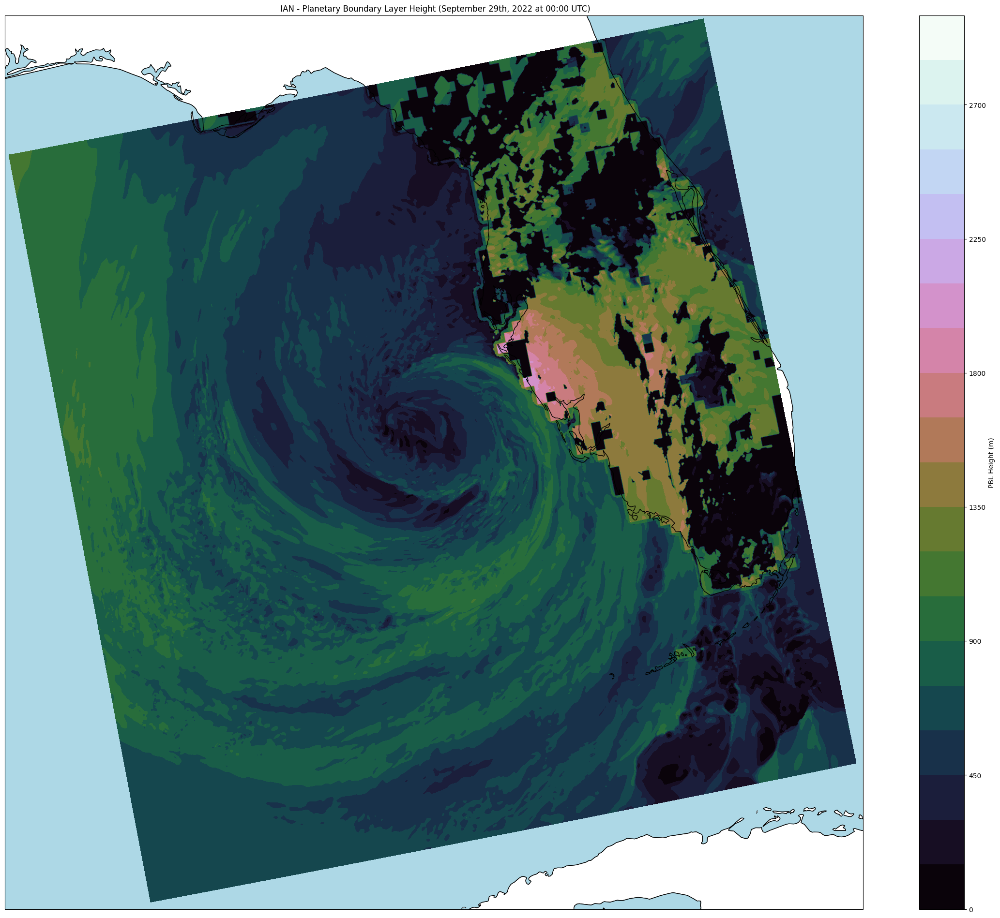

In [ ]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Define the path to your NetCDF file
data = 'data/wrfout_d03_2022-09-26_Ian2022_UNCPL.nc'
dataset = nc.Dataset(data, 'r')

# Extract coordinates and Times
xlat = dataset.variables['XLAT'][0, :, :]
xlong = dataset.variables['XLONG'][0, :, :]
times = dataset.variables['Times'][:]
times_str = [''.join(char.decode('utf-8') if isinstance(char, bytes) else str(char)
                     for char in time if not np.ma.is_masked(char)).strip().rstrip('\x00')
             for time in times]

# Convert the last timestamp to the desired format
last_time = times_str[-1]  # e.g., '2022-09-29_00:00:00'
# Parse the string to a datetime object
dt = datetime.strptime(last_time, '%Y-%m-%d_%H:%M:%S')
# Function to add ordinal suffix (st, nd, rd, th)
def ordinal(n):
    if 10 <= n % 100 <= 20:
        suffix = 'th'
    else:
        suffix = {1: 'st', 2: 'nd', 3: 'rd'}.get(n % 10, 'th')
    return str(n) + suffix
# Format the date as 'September 29th, 2022 (00:00 UTC)'
formatted_time = f"{dt.strftime('%B')} {ordinal(dt.day)}, {dt.year} at {dt.strftime('%H:%M')} UTC"

# Extract PBLH at the last timestep
pblh = dataset.variables['PBLH'][-1, :, :]

# Create the plot
fig, ax = plt.subplots(figsize=(30, 24), subplot_kw={'projection': ccrs.LambertConformal()})
ax.set_extent([xlong.min(), xlong.max(), xlat.min(), xlat.max()], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, facecolor='white', edgecolor='black')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

contour = ax.contourf(xlong, xlat, pblh, transform=ccrs.PlateCarree(),
                      cmap='cubehelix', levels=np.linspace(0, 3000, 21))
plt.colorbar(contour, label='PBL Height (m)')
plt.title(f' IAN - Planetary Boundary Layer Height ({formatted_time})', fontsize=24)
plt.show()

dataset.close()